## FINAL PROJECT 2 : LOGISTIC REGRESSION & SVM

# KELOMPOK 7

RainAUS DATASET

Introduction

Project ini untuk memenuhi tugas dari Course Introduction To Python For Data Science

Our Members:

a. Nama: Minan Abdillah ID: PYTN-KS16-010 

b. Michael Vincent Efren Malomo ID: PYTN-KS16-016 

c. Muhammad Danu Prasetia ID: PYTN-KS16-020

Abstract

Kekeringan diawali dan dipertahankan secara signifikan oleh defisit curah hujan. Studi ini menunjukkan bahwa kekeringan meteorologis di Australia sangat berkaitan dengan perubahan terjadinya curah hujan lebat. Kami menggunakan indeks curah hujan standar untuk mengidentifikasi periode awal kekeringan, perkembangan kekeringan, dan pemulihan dari kekeringan. Metode ini berhasil mengidentifikasi periode kekeringan multi-tahun yang besar di Australia, yang berdampak besar pada berbagai sektor. Kami menunjukkan bahwa terjadinya kekeringan meteorologi (yaitu defisit curah hujan) di Australia diatur oleh perubahan hari-hari dengan curah hujan yang signifikan. Hari-hari dengan curah hujan di atas 20 mm bertanggung jawab atas median sekitar 60% pengurangan curah hujan selama periode perkembangan kekeringan, dan sekitar 70% surplus curah hujan selama periode pemulihan kekeringan. Perubahan hari-hari dengan akumulasi curah hujan yang lebih tinggi, yang merupakan kontributor terbesar terhadap total pengurangan curah hujan selama musim kemarau, setara dengan curah hujan yang sangat sedikit dalam setahun: setara dengan kurang dari 10 hari/tahun di sebagian besar benua. Pengurangan hari-hari dengan curah hujan yang tinggi namun jarang inilah yang mengakibatkan suatu lokasi diklasifikasikan sebagai kekeringan meteorologis. Demikian pula, kejadian di atas rata-rata pada hari-hari tersebut akan mengindikasikan periode pemulihan setidaknya sebagian dari kekeringan. Frekuensi hari-hari dengan curah hujan tinggi dan kontribusinya terhadap akumulasi curah hujan terbukti penting. Hasil-hasil ini menunjukkan bahwa penyelidikan terhadap sistem cuaca sinoptik yang bertanggung jawab atas hari-hari dengan curah hujan tinggi, serta perubahan frekuensi kemunculan sistem-sistem ini dan kontribusi relatifnya terhadap total curah hujan, diperlukan untuk memajukan pemahaman tentang kekeringan di Australia.(https://www.sciencedirect.com/science/article/pii/S2212094722001074)

Attribute Information Dataset:

* Date - tanggal hari itu

* Location - lokasi, nama kota di Australia

* MinTemp - temperatur terendah hari itu dalam celcius

* MaxTemp - temperatur tertinggi hari itu dalam celcius

* Rainfall - jumlah curah hujan hari itu dalam mm

* Evaporation - jumlah evaporasi dalam mm dari Class A pan selama 24 jam

* sebelum jam 9 pagi hari itu

* Sunshine - jumlah jam hari itu cerah dengan cahaya matahari

* WindGustDir - arah kecepatan angin yang paling tinggi selama 24 jam sebelum

* jam 12 malam hari itu

* WindGustSpeed - kecepatan angin yang paling tinggi dalam km/jam selama 24

* jam sebelum jam 12 malam hari itu

* WindDir9am - arah angin jam 9 pagi

* WindDir3pm - arah angin jam 3 sore

* WindSpeed9am - kecepatan angin jam 9 pagi dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore

* WindSpeed3pm - kecepatan angin jam 3 sore dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore

* Humidity9am - humiditas jam 9 pagi dalam persen

* Humidity3pm - humiditas jam 3 sore dalam persen

* Pressure9am - tekanan udara jam 9 pagi dalam hpa

* Pressure3pm - tekanan udara jam 3 sore dalam hpa

* Cloud9am - persentase langit yang tertutup awan jam 9 pagi. dihitung dalam
oktas, unit 1⁄8, menghitung berapa unit 1⁄8 dari langit yang tertutup awan. Jika 0,
langit cerah, jika 8, langit sepenuhnya tertutup awan.

* Cloud3pm - persentase langit yang tertutup awan jam 3 sore

* Temp9am - temperatur jam 9 pagi dalam celcius

* Temp3pm - temperatur jam 3 sore dalam celcius

* RainToday - apakah hari ini hujan: jika curah hujan 24 jam sebelum jam 9 pagi
melebihi 1mm, maka nilai ini adalah 1, jika tidak nilai nya 0

* RainTomorrow - variable yang mau di prediksi

IMPORT LIBRARY YANG DIBUTUHKAN

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder
from scipy.stats import skew
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import svm

IMPORT DATASET

In [2]:
df = pd.read_csv('dataset/weatherAUS.csv')

In [3]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
df.shape

(145460, 23)

EDA & DATA CLEANING

Data Exploration

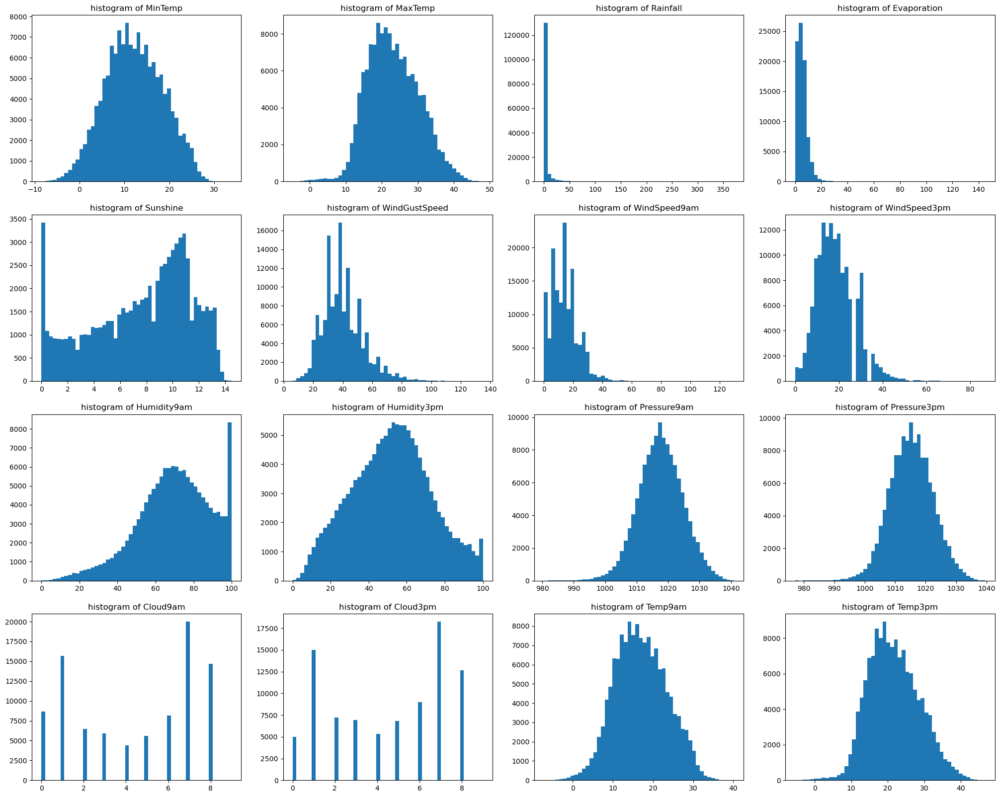

In [7]:
numerical_column = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation','Sunshine','WindGustSpeed',
                   'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm','Pressure9am', 'Pressure3pm', 
                    'Cloud9am', 'Cloud3pm', 'Temp9am','Temp3pm']
fig, ax = plt.subplots(4,4, sharex=False, sharey=False, figsize=(25,20))
count = 0
for num_col in numerical_column:
    ax_x = count//4
    ax_y = count%4
    
    ax[ax_x, ax_y].hist(df[num_col], bins=50)
    ax[ax_x, ax_y].set_title(f"histogram of {num_col}")
    count+=1
plt.show()

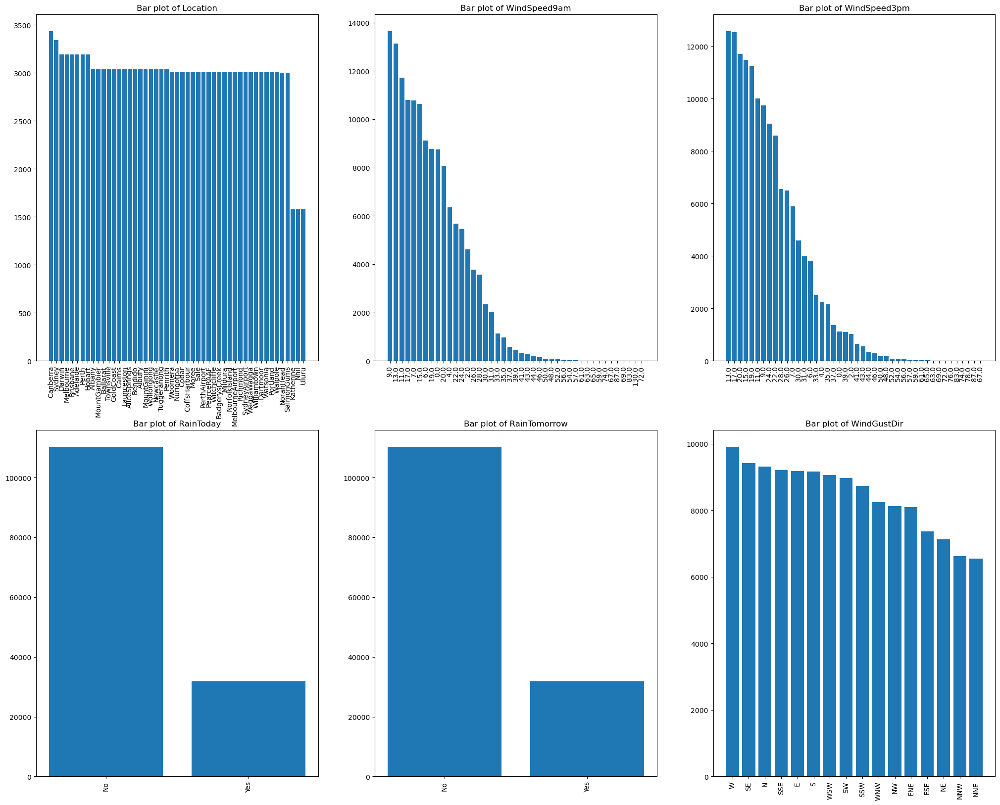

In [8]:
# Categorical columns exploration
categorical_cols = ['Location','WindSpeed9am', 'WindSpeed3pm','RainToday', 'RainTomorrow','WindGustDir']
fig, ax = plt.subplots(2,3, sharex=False, sharey=False, figsize=(25,20))
count = 0
for cat_col in categorical_cols:
    value_count = df[cat_col].value_counts()
    ax_x = count//3
    ax_y = count%3
    x_range = np.arange(0, len(value_count))
    ax[ax_x, ax_y].bar(x_range, value_count.values, tick_label=value_count.index)
    ax[ax_x, ax_y].set_title(f"Bar plot of {cat_col}")
    
    for i in ax[ax_x, ax_y].get_xticklabels():
        i.set_rotation(90)
    
    count+=1
plt.show()

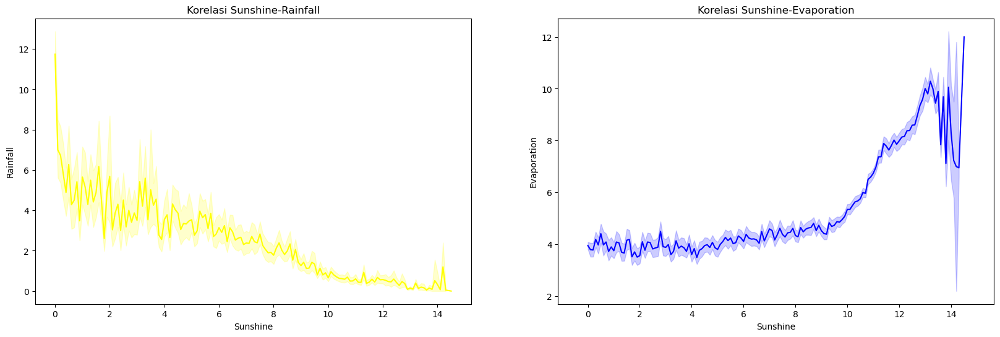

In [9]:
plt.rcParams['figure.figsize']=(20,6)
plt.subplot(121)
plt.title("Korelasi Sunshine-Rainfall")
sns.lineplot(data=df, x='Sunshine',y='Rainfall', color='yellow')

plt.subplot(122)
plt.title("Korelasi Sunshine-Evaporation")
sns.lineplot(data=df, x='Sunshine', y='Evaporation', color='blue')
plt.axis('equal')
plt.show()

Dapat dilihat bahwa Sunshine(intensitas cahaya matahari) berbanding terbalik dengan Rainfall(jumlah curah hujan), semakin rendah nilai sunshine semakin tinggi nilai Rainfall dan sebaliknya. sedangkan korelasi antara Sunshine berbanding lurus dengan Evaporation (penguapan), semakin tinggi nilai Sunshine semakin tinggi pula nilai Evaporation.

Melihat keseimbangan data dari RainTomorrow

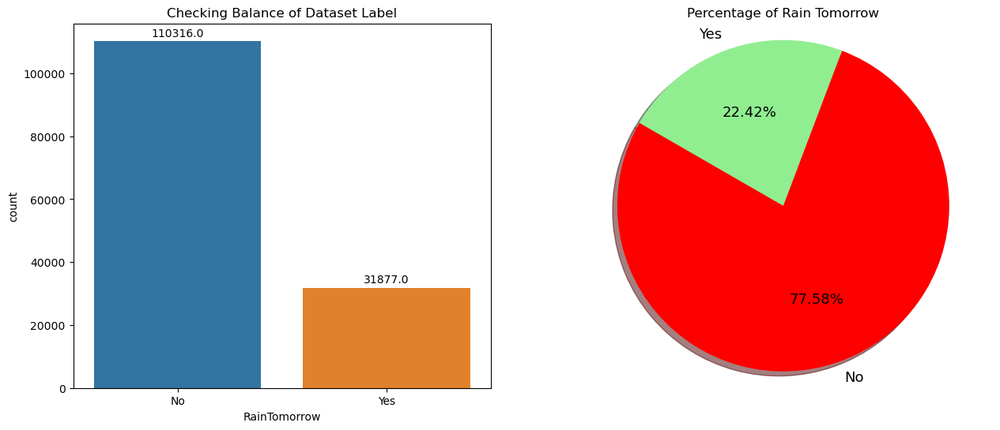

In [10]:
# mengecek keseimbangan jumlah label/output dataset
plt.rcParams['figure.figsize']=(15,6)
plt.subplot(121)
plt.title("Checking Balance of Dataset Label")
ax = sns.countplot(x='RainTomorrow', data=df)
for i in ax.patches:
    ax.annotate(format(i.get_height(),'0.1f'), (i.get_x() + i.get_width()/2.,i.get_height()),
               ha='center', va='center', xytext=(0,7), textcoords='offset points')
    
plt.subplot(122)
plt.title("Percentage of Rain Tomorrow")
subscribed_values_count = df['RainTomorrow'].value_counts()
subscribed_size = subscribed_values_count.values.tolist()
subscribed_labels = 'No', 'Yes'
colors=['red', 'lightgreen']
pcs, texts, autotexts = plt.pie(subscribed_size, labels=subscribed_labels, colors=colors,
                             autopct='%2.2f%%', shadow=True, startangle=150)

for text, autotext in zip(texts, autotexts):
    text.set_fontsize(13)
    autotext.set_fontsize(13)

plt.axis('equal')
plt.show()

dapat dilihat dari visualisasi bahwa "No" memiliki nilai lebih besar daripada "Yes"

Data RainTomorrow-Location YES

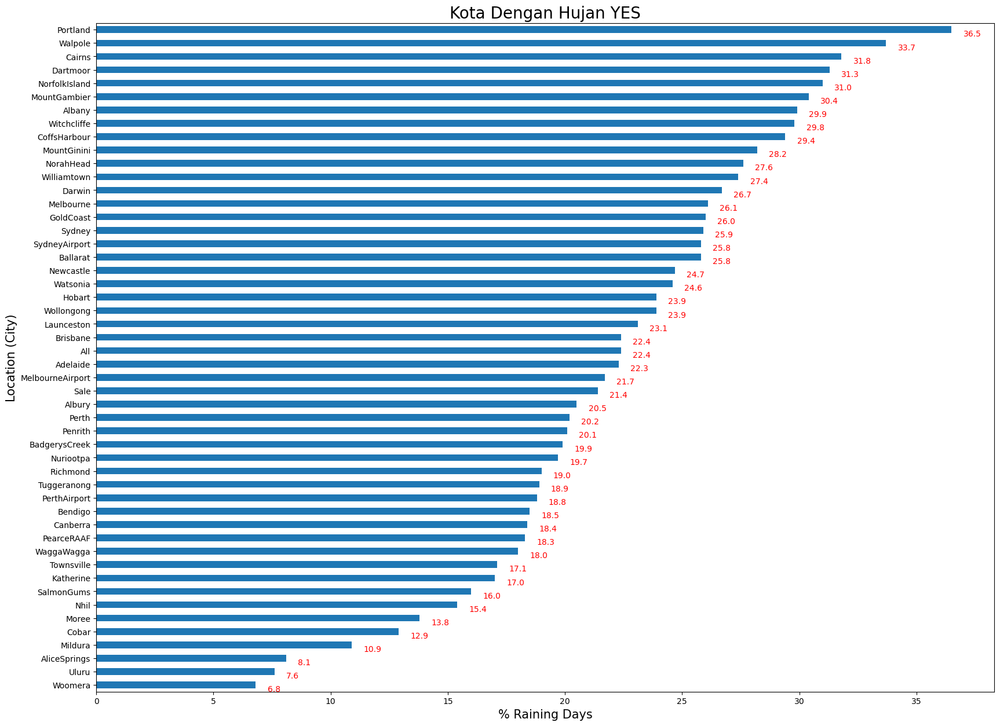

In [11]:
location_rain = pd.crosstab(index=df['Location'], columns=df['RainTomorrow'], values=df['RainTomorrow'],
                           aggfunc='count', margins=True)
location_rain['% Yes'] = (location_rain['Yes']/location_rain['All']).round(3)*100
fig, ax = plt.subplots(figsize=(20,15))
location_rain['% Yes'].sort_values().plot(kind='barh')
ax.set_xlabel("% Raining Days", fontsize=15)
ax.set_ylabel("Location (City)", fontsize=15)
ax.set_title("Kota Dengan Hujan YES", fontsize=20)
y = location_rain['% Yes'].sort_values().values
for k,v in enumerate(y):
    ax.text(v+0.5 , k-0.5 , round(float(v),1), color='red')

dari visualisasi diatas dapat dilihat bahwa portland memiliki nilai tertinggi dengan kategori "Yes"

Data RainTomorrow-Location NO

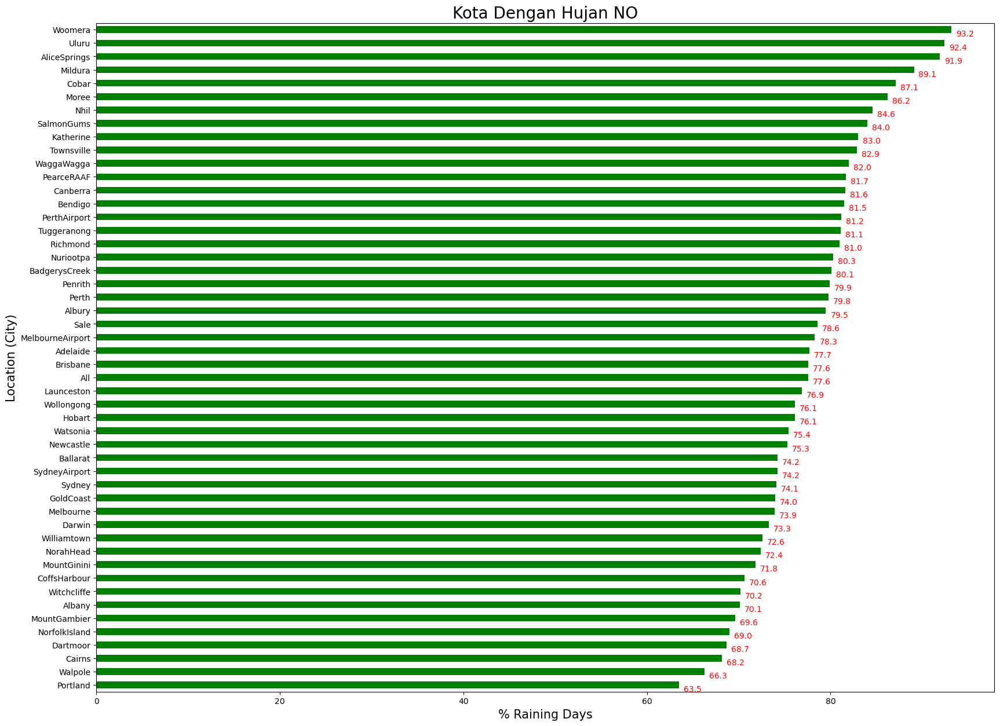

In [12]:
location_rain = pd.crosstab(index=df['Location'], columns=df['RainTomorrow'], values=df['RainTomorrow'],
                           aggfunc='count', margins=True)
location_rain['% No'] = (location_rain['No']/location_rain['All']).round(3)*100
fig, ax = plt.subplots(figsize=(20,15))
location_rain['% No'].sort_values().plot(kind='barh', color='green')
ax.set_xlabel("% Raining Days", fontsize=15)
ax.set_ylabel("Location (City)", fontsize=15)
ax.set_title("Kota Dengan Hujan NO", fontsize=20)
y = location_rain['% No'].sort_values().values
for k,v in enumerate(y):
    ax.text(v+0.5 , k-0.5 , round(float(v),1), color='red')

dari visualisasi diatas dapat dilihat bahwa woomera memiliki nilai tertinggi dengan kategori "No"

Data RainTomorrow-Location YES & NO

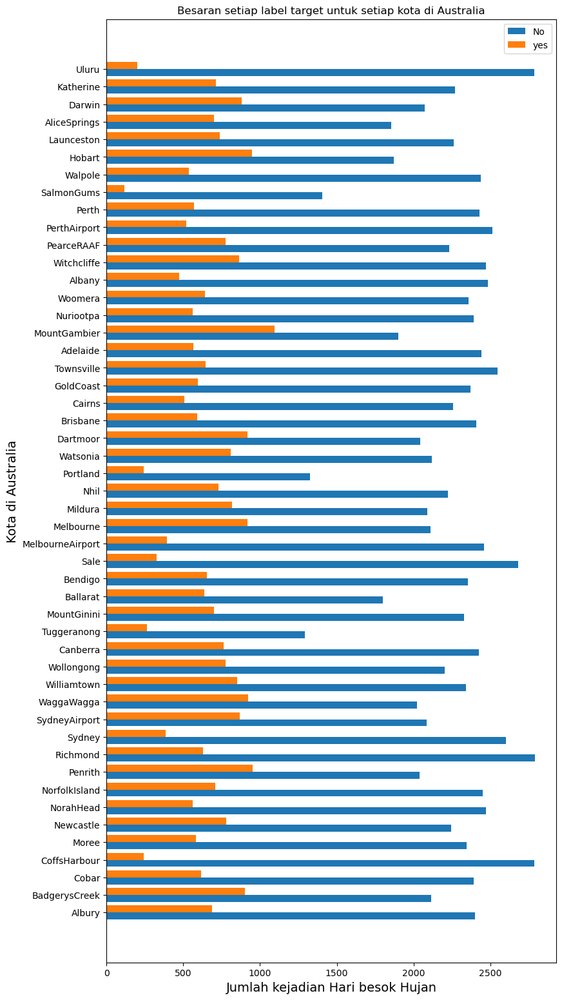

In [13]:
# Target 'No' berdasarkan kota
kota_no = df[
    (df['RainTomorrow']=="No")
].groupby('Location').count()['RainTomorrow'].values

# Target 'Yes' berdasarkan kota
kota_yes = df[
    (df['RainTomorrow']=="Yes")
].groupby('Location').count()['RainTomorrow'].values

# Visualize
sumbu_y_ticks = list(df['Location'].unique())
sumbu_y_axis = np.arange(0,len(sumbu_y_ticks),1)

plt.figure(figsize=(9,19))
plt.barh(sumbu_y_axis-0.2, kota_no,0.4,label='No')
plt.barh(sumbu_y_axis + 0.2, kota_yes, 0.4, label = 'yes')
plt.yticks(sumbu_y_axis,sumbu_y_ticks, )
plt.ylabel("Kota di Australia", fontsize=14)
plt.xlabel("Jumlah kejadian Hari besok Hujan", fontsize=14)
plt.title("Besaran setiap label target untuk setiap kota di Australia")
plt.legend()
plt.show()

dari visualisasi diatas dapat dilihat bahwa MountGambier memiliki kategori "Yes" tertinggi, sedangkan Uluru, Richmond, dan CoffsHarbour memiliki kategori "No" tertinggi

Korelasi Month & RainTomorrow

In [14]:
df['Month'] = pd.DatetimeIndex(df['Date']).month

In [15]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,6
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,6
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,6
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,6


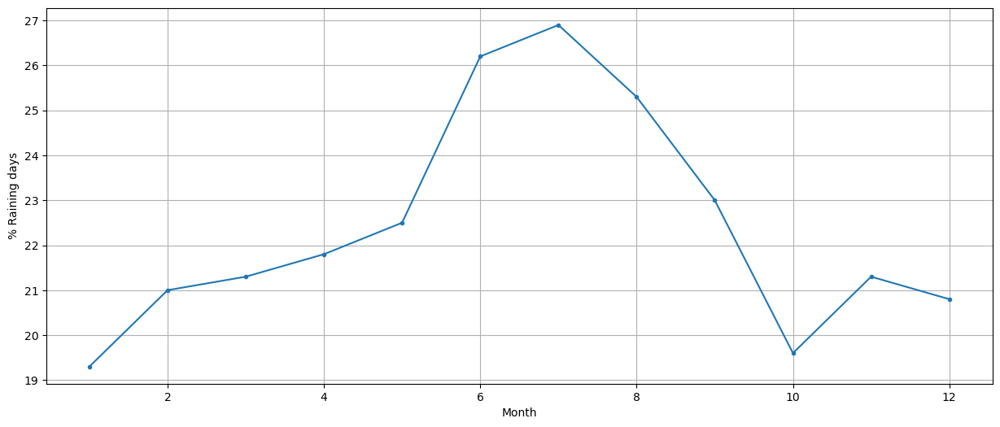

In [16]:
rain_by_month = pd.crosstab(index=df['Month'], columns=df['RainTomorrow'],margins=True)
rain_by_month['% Yes'] = (rain_by_month['Yes']/rain_by_month['All']).round(3)*100
rain_by_month.iloc[:-1,-1].plot(style=".-")
plt.xlabel("Month")
plt.ylabel("% Raining days")
plt.grid()

dari visualisasi menunjukkan curah hujan tertinggi ada di bulan juni - juli

Pengaruh Temp3pm & Humidity3pm dengan RainTomorrow

In [17]:
px.scatter(df.sample(5000), x='Temp3pm', y='Humidity3pm',
           title="Humadity (3PM) vs Temperature (3PM)",color='RainTomorrow')

* Jika hari ini (3PM) temperatur tinggi dan Kelembapan (Humadity) rendah, kemungkinan untuk turun hujan pada hari setelahnya memiliki probabilitas yang rendah.
* Jika temperatur hari ini (3PM) rendah dan kelembapan hari ini (3PM) tinggi, kemungkinan hari besoknya akan turun hujan memiliki probabilitas yang cukup tinggi.

Korelasi Temp3pm & RainTomorrow

In [18]:
px.histogram(df, title="Temperature (3PM) vs Rain Tomorrow",
          x="Temp3pm",color='RainTomorrow')

visualisasi diatas menunjukkan distribusi data normal, ketika temperatur lebih rendah kemungkinan untuk hari berikutnya mengalami hujan cukup tinggi. fitur Temp3pm merupakan salah satu fitur yang cukup vital dalam menentukan apakah hari selanjutnya mengalami hujan atau tidak

Korelasi Humidity3pm & RainTomorrow

In [19]:
px.histogram(df, title="Humidity (3PM) vs Rain Tomorrow",
          x="Humidity3pm",color='RainTomorrow')

visualisasi diatas menunjukkan distribusi data normal, ketika humidity lebih tinggi kemungkinan untuk hari berikutnya mengalami hujan cukup tinggi. fitur Humidity3pm merupakan salah satu fitur yang cukup vital dalam menentukan apakah hari selanjutnya mengalami hujan atau tidak

DATA CLEANING

In [20]:
missing_values = pd.DataFrame(df.isna().sum().sort_values(ascending=False), columns=['Column'])

In [21]:
missing_values

,Column
Sunshine,69835
Evaporation,62790
Cloud3pm,59358
Cloud9am,55888
Pressure9am,15065
Pressure3pm,15028
WindDir9am,10566
WindGustDir,10326
WindGustSpeed,10263
Humidity3pm,4507


In [22]:
df.dropna(subset=['RainTomorrow'], inplace=True)

In [23]:
df.isnull().sum()

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RainTomorrow         0
Month                0
dtype: int64

In [24]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Month'],
      dtype='object')

In [25]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          679
Evaporation       356
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           440
Temp3pm           500
RainToday           2
RainTomorrow        2
Month              12
dtype: int64

In [26]:
numerical_column = df.select_dtypes(include=['float64', 'int64']).columns.values
object_column = df.select_dtypes(include=['object']).columns.values

In [27]:
numerical_column

array(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am',
       'Cloud3pm', 'Temp9am', 'Temp3pm', 'Month'], dtype=object)

In [28]:
# mencetak nilai unik yang terdapat pada setiap atribut yang bertipe numerical
for num_col in numerical_column:
    print("Nilai unik atribut {} ({} nilai)".format(num_col.upper(),df[num_col].nunique()))
    print(np.sort(df[num_col].unique()))
    print("="*30)

Nilai unik atribut MINTEMP (389 nilai)
[-8.5 -8.2 -8.  -7.8 -7.6 -7.5 -7.3 -7.2 -7.1 -7.  -6.9 -6.8 -6.7 -6.6
 -6.5 -6.4 -6.3 -6.2 -6.1 -6.  -5.9 -5.8 -5.7 -5.6 -5.5 -5.4 -5.3 -5.2
 -5.1 -5.  -4.9 -4.8 -4.7 -4.6 -4.5 -4.4 -4.3 -4.2 -4.1 -4.  -3.9 -3.8
 -3.7 -3.6 -3.5 -3.4 -3.3 -3.2 -3.1 -3.  -2.9 -2.8 -2.7 -2.6 -2.5 -2.4
 -2.3 -2.2 -2.1 -2.  -1.9 -1.8 -1.7 -1.6 -1.5 -1.4 -1.3 -1.2 -1.1 -1.
 -0.9 -0.8 -0.7 -0.6 -0.5 -0.4 -0.3 -0.2 -0.1  0.   0.1  0.2  0.3  0.4
  0.5  0.6  0.7  0.8  0.9  1.   1.1  1.2  1.3  1.4  1.5  1.6  1.7  1.8
  1.9  2.   2.1  2.2  2.3  2.4  2.5  2.6  2.7  2.8  2.9  3.   3.1  3.2
  3.3  3.4  3.5  3.6  3.7  3.8  3.9  4.   4.1  4.2  4.3  4.4  4.5  4.6
  4.7  4.8  4.9  5.   5.1  5.2  5.3  5.4  5.5  5.6  5.7  5.8  5.9  6.
  6.1  6.2  6.3  6.4  6.5  6.6  6.7  6.8  6.9  7.   7.1  7.2  7.3  7.4
  7.5  7.6  7.7  7.8  7.9  8.   8.1  8.2  8.3  8.4  8.5  8.6  8.7  8.8
  8.9  9.   9.1  9.2  9.3  9.4  9.5  9.6  9.7  9.8  9.9 10.  10.1 10.2
 10.3 10.4 10.5 10.6 10.7 10.8 10.9 11. 

[ 977.1    978.2    979.     980.2    981.2    981.4    981.9    982.2
  982.6    982.9    983.2    983.3    984.     984.2    984.4    984.5
  984.9    985.     985.1    985.2    985.3    985.4    985.5    985.6
  985.8    986.     986.1    986.2    986.4    986.5    986.6    986.8
  986.9    987.     987.1    987.2    987.3    987.4    987.6    987.7
  987.8    988.     988.1    988.2    988.3    988.4    988.5    988.6
  988.7    988.8    988.9    989.     989.1    989.2    989.3    989.4
  989.5    989.6    989.7    989.8    989.9    990.     990.1    990.2
  990.3    990.4    990.5    990.6    990.7    990.8    990.9    991.
  991.1    991.2    991.3    991.4    991.5    991.6    991.7    991.8
  991.9    992.     992.1    992.2    992.3    992.4    992.5    992.6
  992.7    992.8    992.9    993.     993.1    993.2    993.3    993.4
  993.5    993.6    993.7    993.8    993.9    994.     994.1    994.2
  994.3    994.4    994.5    994.6    994.7    994.8    994.9    995.
  995.1 

In [29]:
object_column

array(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'], dtype=object)

In [30]:
# mencetak nilai unik yang terdapat pada setiap atribut yang bertipe categorical
for cat_col in object_column:
    print("Nilai unik atribut {} ({} nilai)".format(cat_col.upper(),df[cat_col].nunique()))
    print(df[cat_col].unique())
    print("="*30)

Nilai unik atribut DATE (3436 nilai)
['2008-12-01' '2008-12-02' '2008-12-03' ... '2008-01-29' '2008-01-30'
 '2008-01-31']
Nilai unik atribut LOCATION (49 nilai)
['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
Nilai unik atribut WINDGUSTDIR (16 nilai)
['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'ENE' 'SSE' 'S' 'NW' 'SE' 'ESE'
 nan 'E' 'SSW']
Nilai unik atribut WINDDIR9AM (16 nilai)
['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 

In [31]:
categorical_missing_values = df[object_column].isnull().sum().sort_values()

<Axes: >

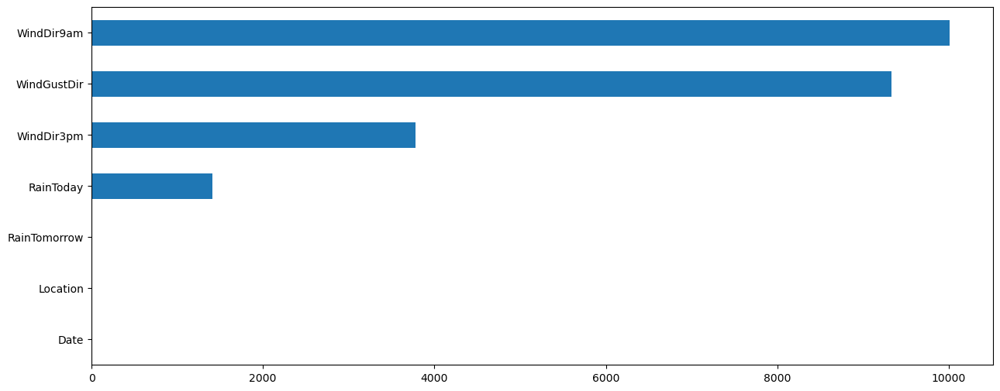

In [32]:
categorical_missing_values.plot(kind='barh')

dari visualisasi menunjukkan bahwa Data & Location tidak ada missing value, dan Rain Tomorrow sudah dihapus sebelumnya

In [34]:
for cat_col in object_column:
    df[cat_col].fillna(df[cat_col].mode()[0], inplace=True)

In [35]:
df.isna().sum()

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir          0
WindGustSpeed     9270
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday            0
RainTomorrow         0
Month                0
dtype: int64

In [36]:
numerical_missing_values = df[numerical_column].isnull().sum().sort_values()

<Axes: >

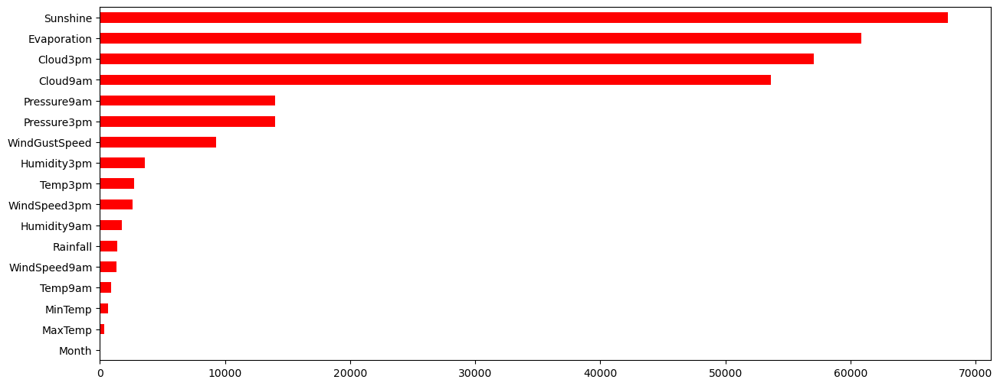

In [37]:
numerical_missing_values.plot(kind='barh', color='red')

dari visualisasi menunjukkan month tidak memiliki missing value

In [38]:
for num_col in numerical_column:
    df[num_col].fillna(df[num_col].median(), inplace=True)

In [39]:
df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
dtype: int64

MELIHAT DAN MENGHAPUS OUTLIER

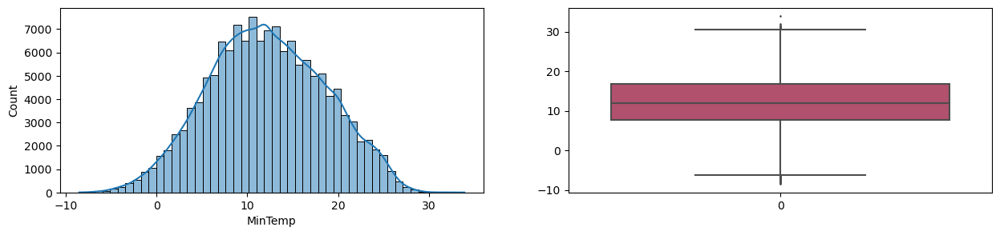

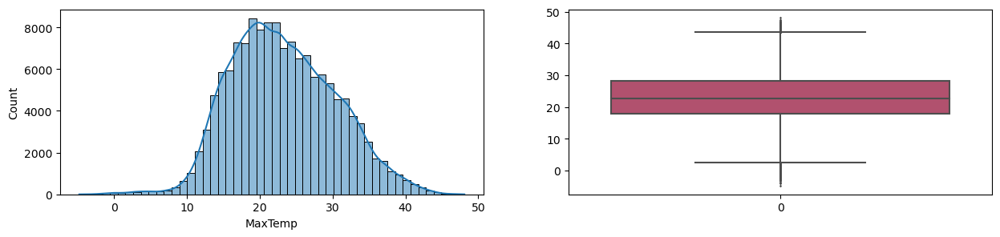

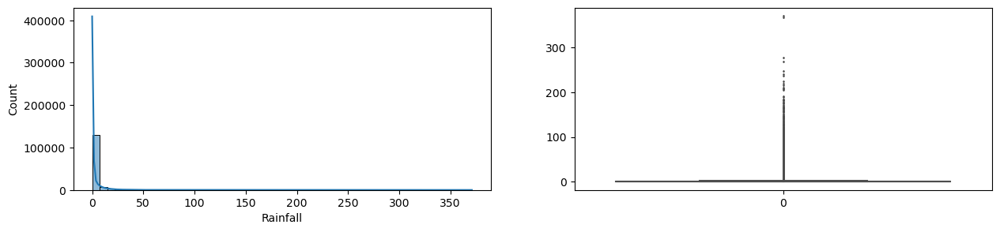

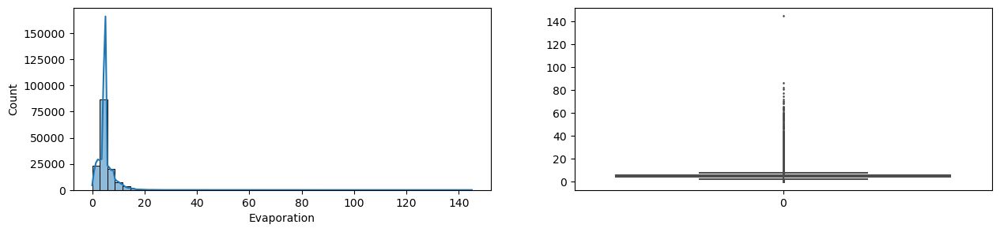

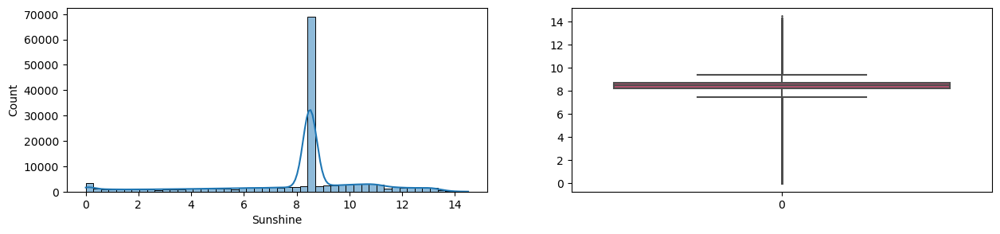

...

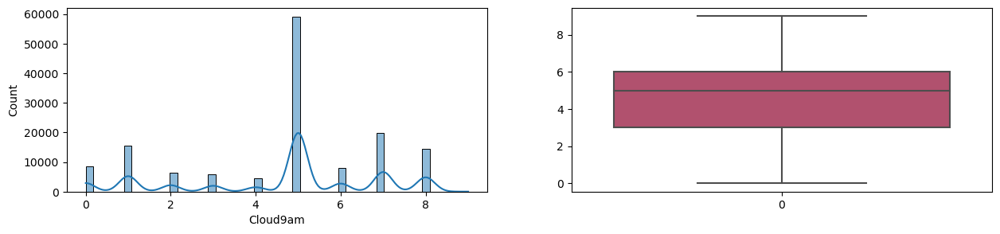

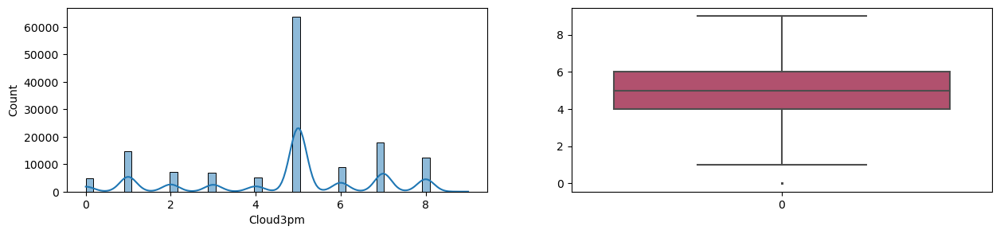

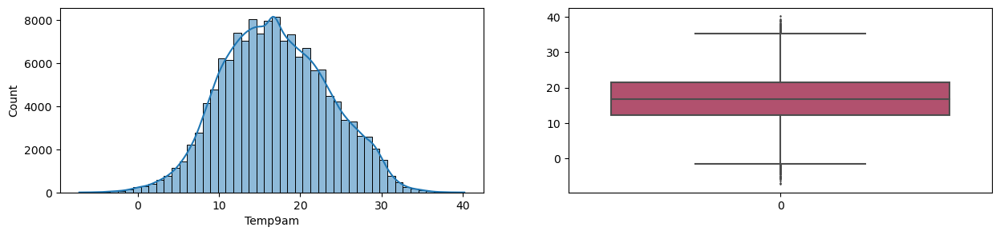

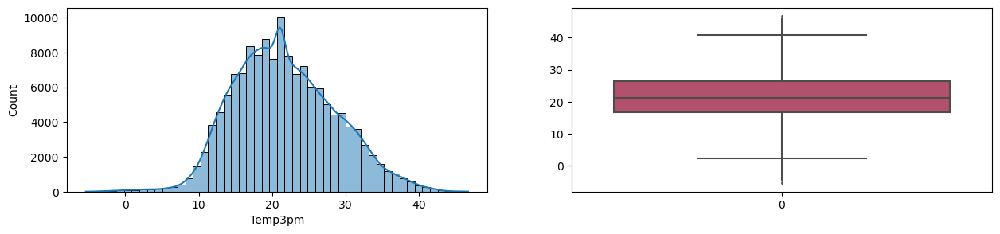

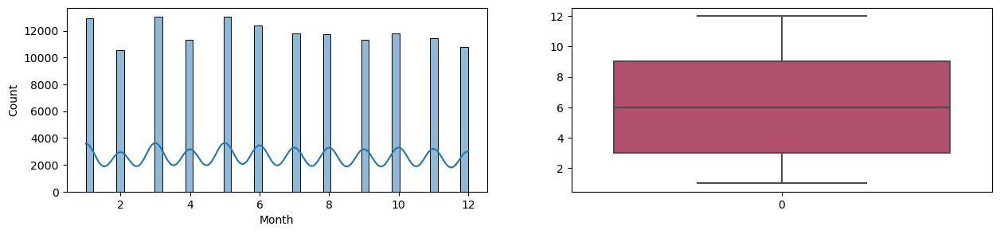

In [40]:
for i in numerical_column:
    fig, ax = plt.subplots(1,2, figsize=(15,3))
    sns.histplot(df[i],bins=50,kde=True, ax=ax[0])
    sns.boxplot(data=df[i], ax=ax[1],palette='flare', fliersize=1)

karena kolom distribusi rainfall & evaporation memiliki distorsi yang besar maka sebaiknya dihapus saja

In [41]:
df.drop("Rainfall", axis=1, inplace=True)
df.head()

,Date,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,2008-12-01,Albury,13.4,22.9,4.8,8.5,W,44.0,W,WNW,...,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No,12
1,2008-12-02,Albury,7.4,25.1,4.8,8.5,WNW,44.0,NNW,WSW,...,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No,12
2,2008-12-03,Albury,12.9,25.7,4.8,8.5,WSW,46.0,W,WSW,...,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No,12
3,2008-12-04,Albury,9.2,28.0,4.8,8.5,NE,24.0,SE,E,...,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No,12
4,2008-12-05,Albury,17.5,32.3,4.8,8.5,W,41.0,ENE,NW,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12


In [42]:
df.drop("Evaporation", axis=1, inplace=True)
df.head()

,Date,Location,MinTemp,MaxTemp,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,2008-12-01,Albury,13.4,22.9,8.5,W,44.0,W,WNW,20.0,...,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No,12
1,2008-12-02,Albury,7.4,25.1,8.5,WNW,44.0,NNW,WSW,4.0,...,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No,12
2,2008-12-03,Albury,12.9,25.7,8.5,WSW,46.0,W,WSW,19.0,...,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No,12
3,2008-12-04,Albury,9.2,28.0,8.5,NE,24.0,SE,E,11.0,...,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No,12
4,2008-12-05,Albury,17.5,32.3,8.5,W,41.0,ENE,NW,7.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12


In [43]:
numerical_column = df.select_dtypes(include=['float64', 'int64']).columns.values
def RemoveOutliers(numerical_column):
    for col in numerical_column:
        iqr = df[col].quantile(0.75)-df[col].quantile(0.25)
        lower_threshold = df[col].quantile(0.25)-(iqr*1.5)
        upper_threshold = df[col].quantile(0.75)+(iqr*1.5)
        print(f"nilai outlier pada fitur {col} : <{round(lower_threshold,2)} atau >{round(upper_threshold,2)}")
        df.loc[(df[col]<=lower_threshold),col] = lower_threshold
        df.loc[(df[col]>=upper_threshold),col] = upper_threshold
RemoveOutliers(numerical_column)

nilai outlier pada fitur MinTemp : <-6.2 atau >30.6
nilai outlier pada fitur MaxTemp : <2.45 atau >43.65
nilai outlier pada fitur Sunshine : <7.45 atau >9.45
nilai outlier pada fitur WindGustSpeed : <8.5 atau >68.5
nilai outlier pada fitur WindSpeed9am : <-11.0 atau >37.0
nilai outlier pada fitur WindSpeed3pm : <-3.5 atau >40.5
nilai outlier pada fitur Humidity9am : <18.0 atau >122.0
nilai outlier pada fitur Humidity3pm : <-5.0 atau >107.0
nilai outlier pada fitur Pressure9am : <1001.05 atau >1034.25
nilai outlier pada fitur Pressure3pm : <998.4 atau >1032.0
nilai outlier pada fitur Cloud9am : <-1.5 atau >10.5
nilai outlier pada fitur Cloud3pm : <1.0 atau >9.0
nilai outlier pada fitur Temp9am : <-1.5 atau >35.3
nilai outlier pada fitur Temp3pm : <2.3 atau >40.7
nilai outlier pada fitur Month : <-6.0 atau >18.0


OUTLIER SUDAH DIHAPUS

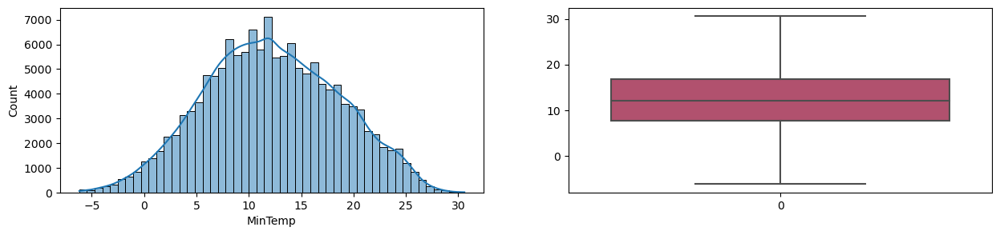

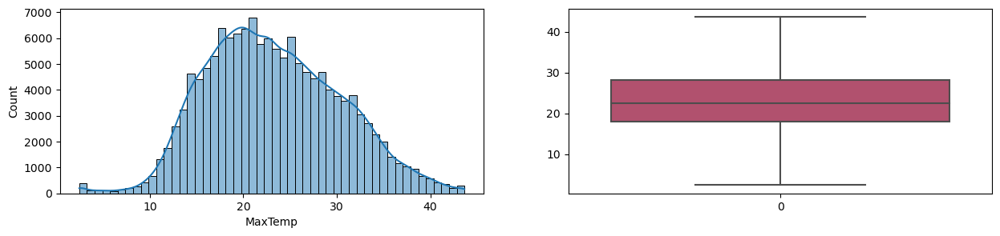

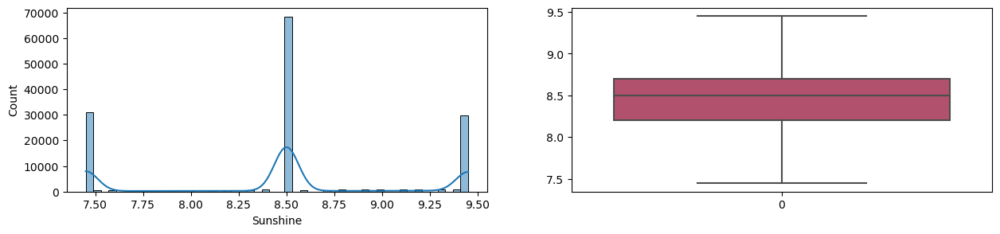

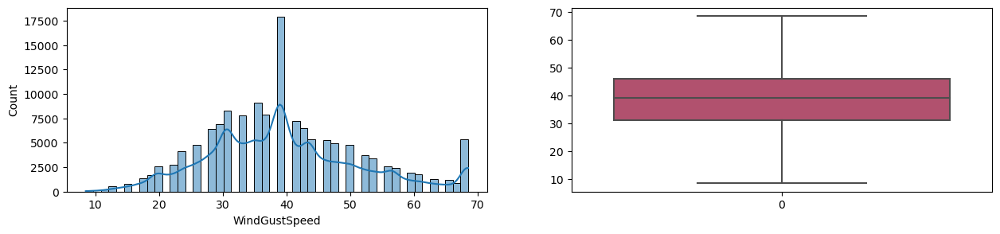

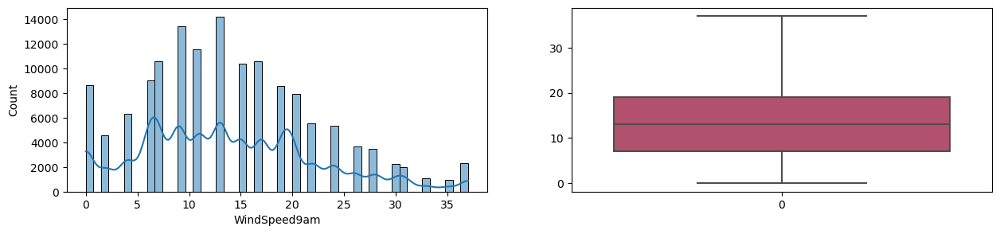

...

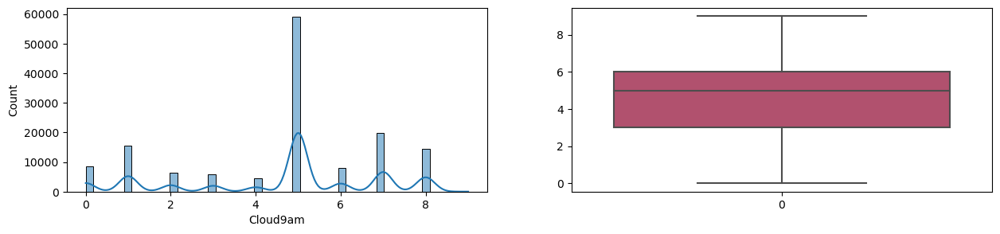

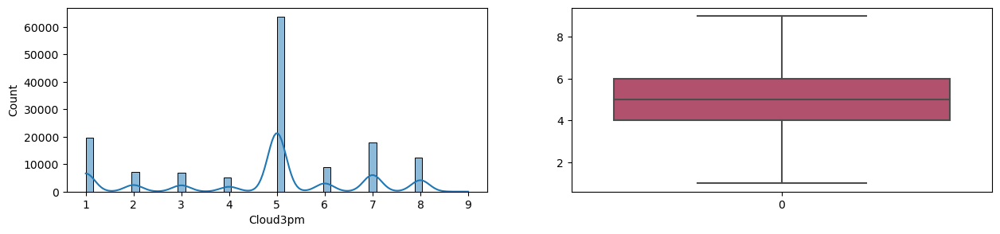

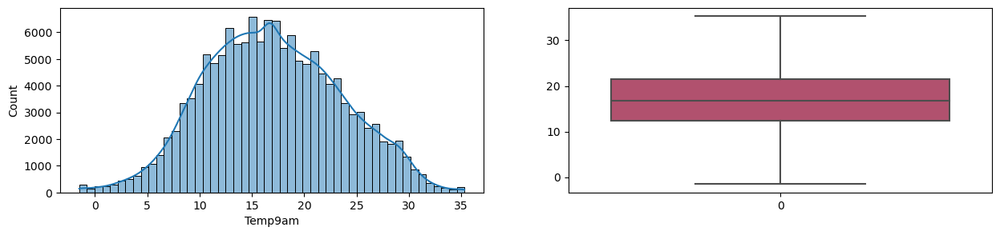

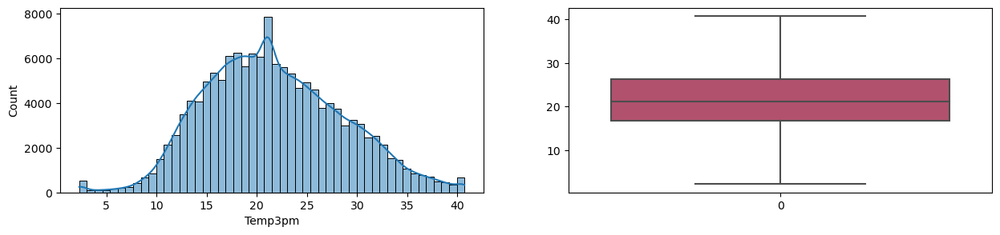

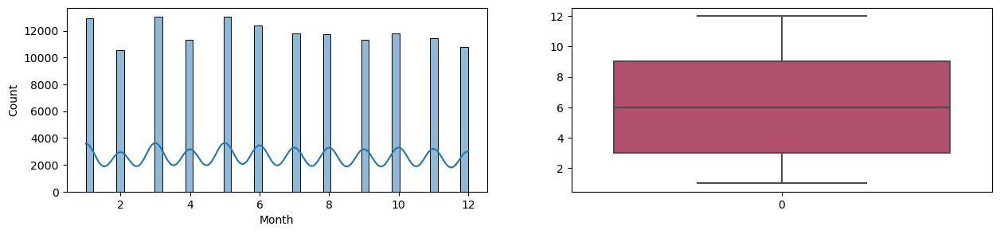

In [44]:
for i in numerical_column:
    fig, ax = plt.subplots(1,2, figsize=(15,3))
    sns.histplot(df[i],bins=50,kde=True, ax=ax[0])
    sns.boxplot(data=df[i], ax=ax[1],palette='flare', fliersize=1)

DATA PREPROCESSING

In [45]:
# Binary encode untuk fitur RainToday dan RainTomorrow
df['RainToday'] = df['RainToday'].replace({'Yes':1,'No':0})
df['RainTomorrow'] = df['RainTomorrow'].replace({'Yes':1,'No':0})

In [46]:
#Encoding semua kolom bertipe cateogory dengan onehot encoder
categorical_cols = df.select_dtypes(include=['object','category']).columns.tolist()
print(categorical_cols)

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        142193 non-null  float64
 3   MaxTemp        142193 non-null  float64
 4   Sunshine       142193 non-null  float64
 5   WindGustDir    142193 non-null  object 
 6   WindGustSpeed  142193 non-null  float64
 7   WindDir9am     142193 non-null  object 
 8   WindDir3pm     142193 non-null  object 
 9   WindSpeed9am   142193 non-null  float64
 10  WindSpeed3pm   142193 non-null  float64
 11  Humidity9am    142193 non-null  float64
 12  Humidity3pm    142193 non-null  float64
 13  Pressure9am    142193 non-null  float64
 14  Pressure3pm    142193 non-null  float64
 15  Cloud9am       142193 non-null  float64
 16  Cloud3pm       142193 non-null  float64
 17  Temp9am        142193 non-nul

In [48]:
df.drop(columns=['Date', 'Location'], axis=1, inplace=True)
df.head()

,MinTemp,MaxTemp,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,13.4,22.9,8.5,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0,12
1,7.4,25.1,8.5,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0,12
2,12.9,25.7,8.5,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0,12
3,9.2,28.0,8.5,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0,12
4,17.5,32.3,8.5,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,12


In [49]:
df.columns

Index(['MinTemp', 'MaxTemp', 'Sunshine', 'WindGustDir', 'WindGustSpeed',
       'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm',
       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am',
       'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'Month'],
      dtype='object')

In [50]:
#Encoding semua kolom bertipe cateogory dengan onehot encoder
categorical_cols = df.select_dtypes(include=['object','category']).columns.tolist()
print(categorical_cols)

['WindGustDir', 'WindDir9am', 'WindDir3pm']


In [51]:
#inisiasi OneHotEncoder dan menggabungkan original dataframe dengan kolom encode ke dataframe
for col in categorical_cols:
        encoder = OneHotEncoder(handle_unknown='ignore')
        encoder_df = pd.DataFrame(encoder.fit_transform(df[[col]]).toarray())
        encoder_df.columns = encoder.get_feature_names_out([col])
        # Menyamakan indeks pada DataFrame Awal dengan indeks pada DataFrame Baru
        df = df.set_index(encoder_df.index)
        df = df.drop(col, axis=1)
        df = pd.concat([df, encoder_df], axis=1)


pada kode diatas adalah proses encoding menggunakan OneHotEncoding dan menggabungkan data encoder dan data original yang juga terdapat set index dari df agar sama dengan encoder_df untuk menghindari missing value

In [52]:
df

,MinTemp,MaxTemp,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.9,8.5,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,7.4,25.1,8.5,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,8.5,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,8.5,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.5,32.3,8.5,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,8.5,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142189,2.8,23.4,8.5,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142190,3.6,25.3,8.5,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142191,5.4,26.9,8.5,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [53]:
df.isna().sum()

MinTemp           0
MaxTemp           0
Sunshine          0
WindGustSpeed     0
WindSpeed9am      0
                 ..
WindDir3pm_SSW    0
WindDir3pm_SW     0
WindDir3pm_W      0
WindDir3pm_WNW    0
WindDir3pm_WSW    0
Length: 65, dtype: int64

In [54]:
df

,MinTemp,MaxTemp,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.9,8.5,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,7.4,25.1,8.5,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,8.5,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,8.5,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.5,32.3,8.5,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,8.5,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142189,2.8,23.4,8.5,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142190,3.6,25.3,8.5,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142191,5.4,26.9,8.5,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 65 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   MinTemp          142193 non-null  float64
 1   MaxTemp          142193 non-null  float64
 2   Sunshine         142193 non-null  float64
 3   WindGustSpeed    142193 non-null  float64
 4   WindSpeed9am     142193 non-null  float64
 5   WindSpeed3pm     142193 non-null  float64
 6   Humidity9am      142193 non-null  float64
 7   Humidity3pm      142193 non-null  float64
 8   Pressure9am      142193 non-null  float64
 9   Pressure3pm      142193 non-null  float64
 10  Cloud9am         142193 non-null  float64
 11  Cloud3pm         142193 non-null  float64
 12  Temp9am          142193 non-null  float64
 13  Temp3pm          142193 non-null  float64
 14  RainToday        142193 non-null  int64  
 15  RainTomorrow     142193 non-null  int64  
 16  Month            142193 non-null  int6

MELIHAT KORELASI DARI BERBAGAI KOLOM YANG SUDAH DITENTUKAN

In [56]:
cols = ['RainTomorrow','MinTemp', 'MaxTemp', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 
        'Humidity3pm', 'Pressure9am', 'Pressure3pm','Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
        'RainToday', 'Month']
new_data = df[cols]
new_data.head()

,RainTomorrow,MinTemp,MaxTemp,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month
0,0,13.4,22.9,8.5,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,12
1,0,7.4,25.1,8.5,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,12
2,0,12.9,25.7,8.5,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,12
3,0,9.2,28.0,8.5,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,12
4,0,17.5,32.3,8.5,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,12


<Axes: >

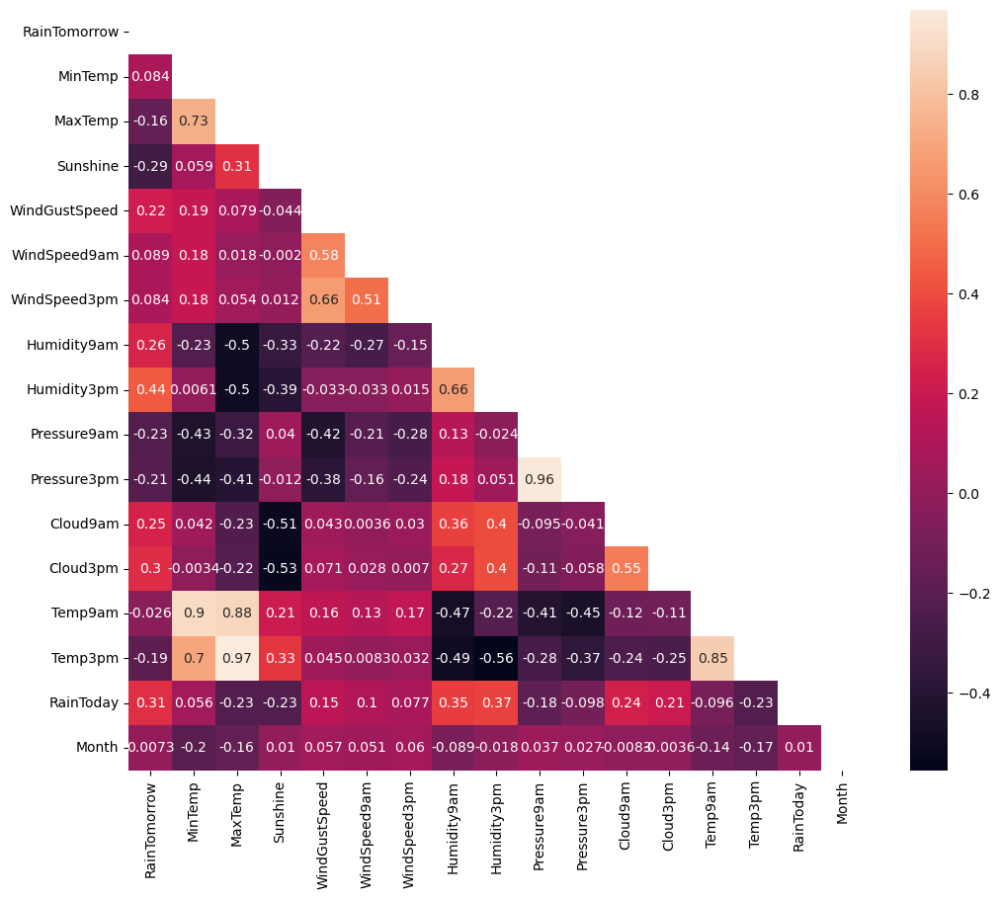

In [57]:
plt.figure(figsize=(12,10))
sns.heatmap(new_data.corr(), annot=True, mask=np.triu(new_data.corr()))

karena columns=['MinTemp', 'MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Temp9am', 'Month'] bernilai kecil sebaiknya dihapus

In [58]:
df.drop(columns=['MinTemp', 'MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Temp9am', 'Month'], axis=1, inplace=True)
df

,Sunshine,WindGustSpeed,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,8.5,44.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,8.5,44.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,8.5,46.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,8.5,24.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,8.5,41.0,82.0,33.0,1010.8,1006.0,7.0,8.0,29.7,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,8.5,31.0,59.0,27.0,1024.7,1021.2,5.0,5.0,20.9,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142189,8.5,31.0,51.0,24.0,1024.6,1020.3,5.0,5.0,22.4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142190,8.5,22.0,56.0,21.0,1023.5,1019.1,5.0,5.0,24.5,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142191,8.5,37.0,53.0,24.0,1021.0,1016.8,5.0,5.0,26.1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


<Axes: >

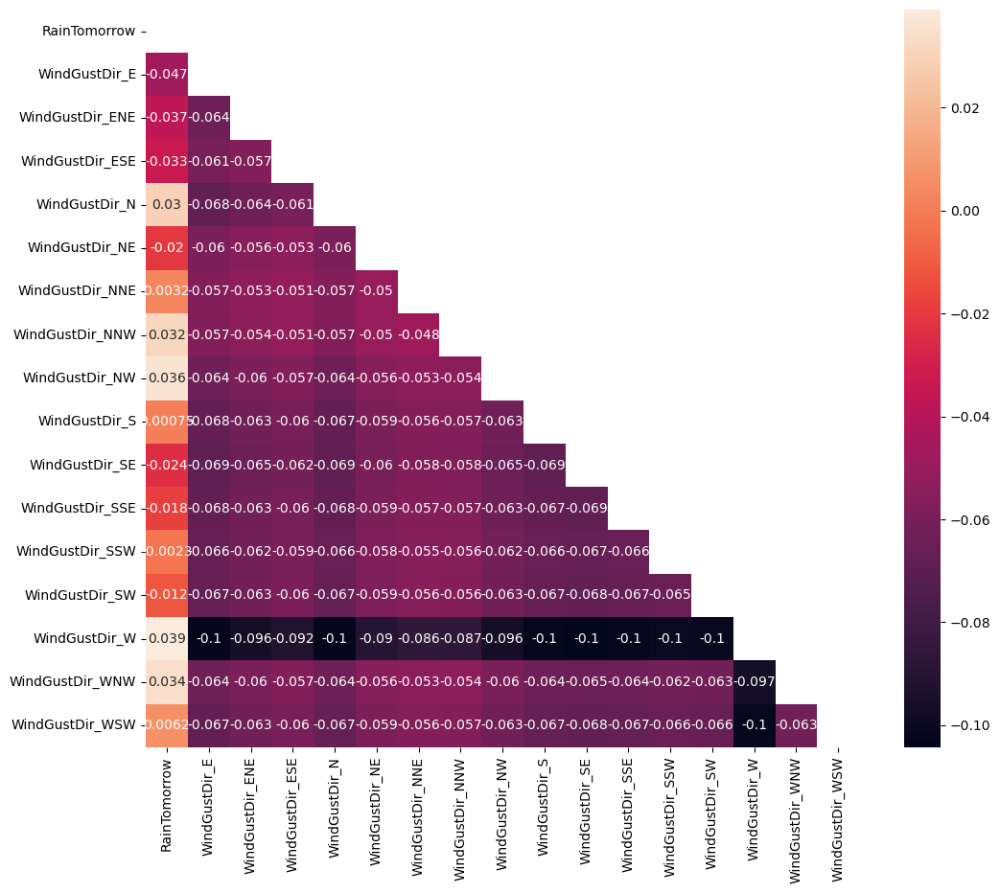

In [59]:
cols = ['RainTomorrow', 'WindGustDir_E','WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N', 'WindGustDir_NE',
       'WindGustDir_NNE', 'WindGustDir_NNW', 'WindGustDir_NW', 'WindGustDir_S', 'WindGustDir_SE','WindGustDir_SSE',
        'WindGustDir_SSW','WindGustDir_SW', 'WindGustDir_W', 'WindGustDir_WNW', 'WindGustDir_WSW']
new_data = df[cols]
plt.figure(figsize=(12,10))
sns.heatmap(new_data.corr(), annot=True, mask=np.triu(new_data.corr()))

Nilai korelasi fitur WindGustDir terhadap RainTomorrow sangat kecil, lebih baik drop fitur fitur tersebut

In [60]:
drop_cols = ['WindGustDir_E','WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N', 'WindGustDir_NE',
       'WindGustDir_NNE', 'WindGustDir_NNW', 'WindGustDir_NW', 'WindGustDir_S', 'WindGustDir_SE','WindGustDir_SSE',
        'WindGustDir_SSW','WindGustDir_SW', 'WindGustDir_W', 'WindGustDir_WNW', 'WindGustDir_WSW']
df.drop(drop_cols, axis=1, inplace=True)
df.columns

Index(['Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm',
       'RainToday', 'RainTomorrow', 'WindDir9am_E', 'WindDir9am_ENE',
       'WindDir9am_ESE', 'WindDir9am_N', 'WindDir9am_NE', 'WindDir9am_NNE',
       'WindDir9am_NNW', 'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE',
       'WindDir9am_SSE', 'WindDir9am_SSW', 'WindDir9am_SW', 'WindDir9am_W',
       'WindDir9am_WNW', 'WindDir9am_WSW', 'WindDir3pm_E', 'WindDir3pm_ENE',
       'WindDir3pm_ESE', 'WindDir3pm_N', 'WindDir3pm_NE', 'WindDir3pm_NNE',
       'WindDir3pm_NNW', 'WindDir3pm_NW', 'WindDir3pm_S', 'WindDir3pm_SE',
       'WindDir3pm_SSE', 'WindDir3pm_SSW', 'WindDir3pm_SW', 'WindDir3pm_W',
       'WindDir3pm_WNW', 'WindDir3pm_WSW'],
      dtype='object')

<Axes: >

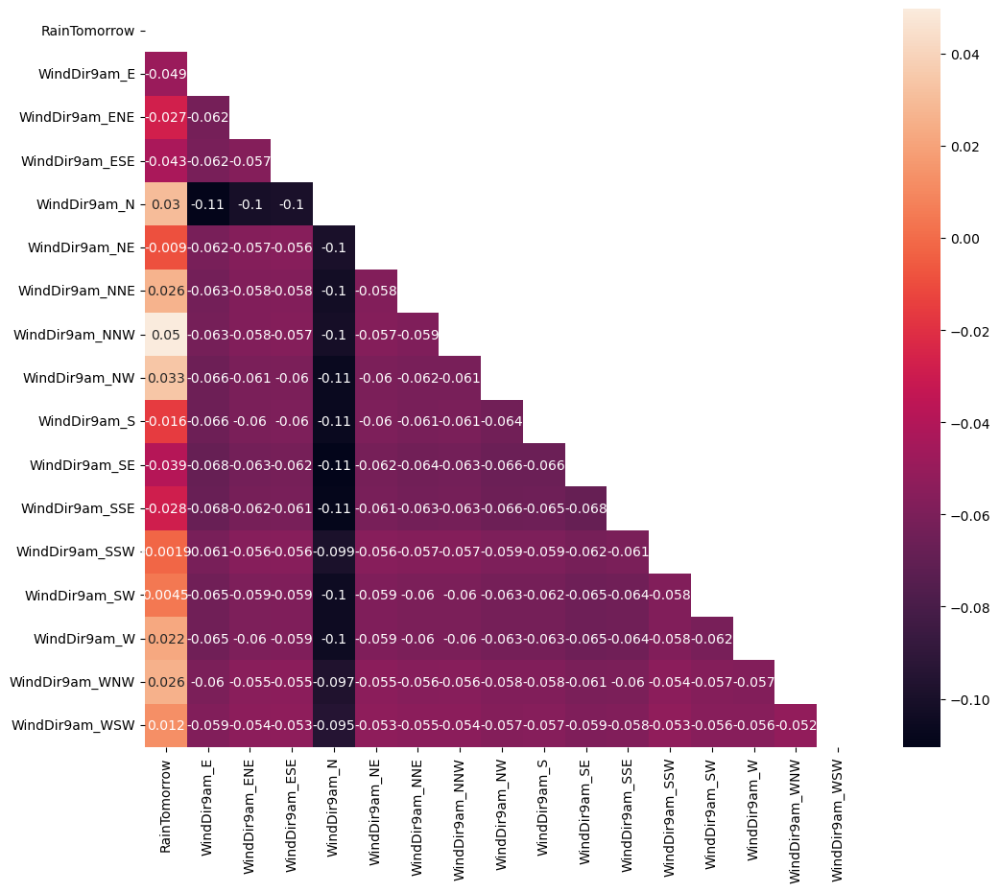

In [61]:
cols = ['RainTomorrow', 'WindDir9am_E','WindDir9am_ENE', 'WindDir9am_ESE', 'WindDir9am_N', 'WindDir9am_NE',
       'WindDir9am_NNE', 'WindDir9am_NNW', 'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE', 'WindDir9am_SSE',
        'WindDir9am_SSW', 'WindDir9am_SW','WindDir9am_W', 'WindDir9am_WNW', 'WindDir9am_WSW']
new_data = df[cols]
plt.figure(figsize=(12,10))
sns.heatmap(new_data.corr(),annot=True, mask=np.triu(new_data.corr()))

<Axes: >

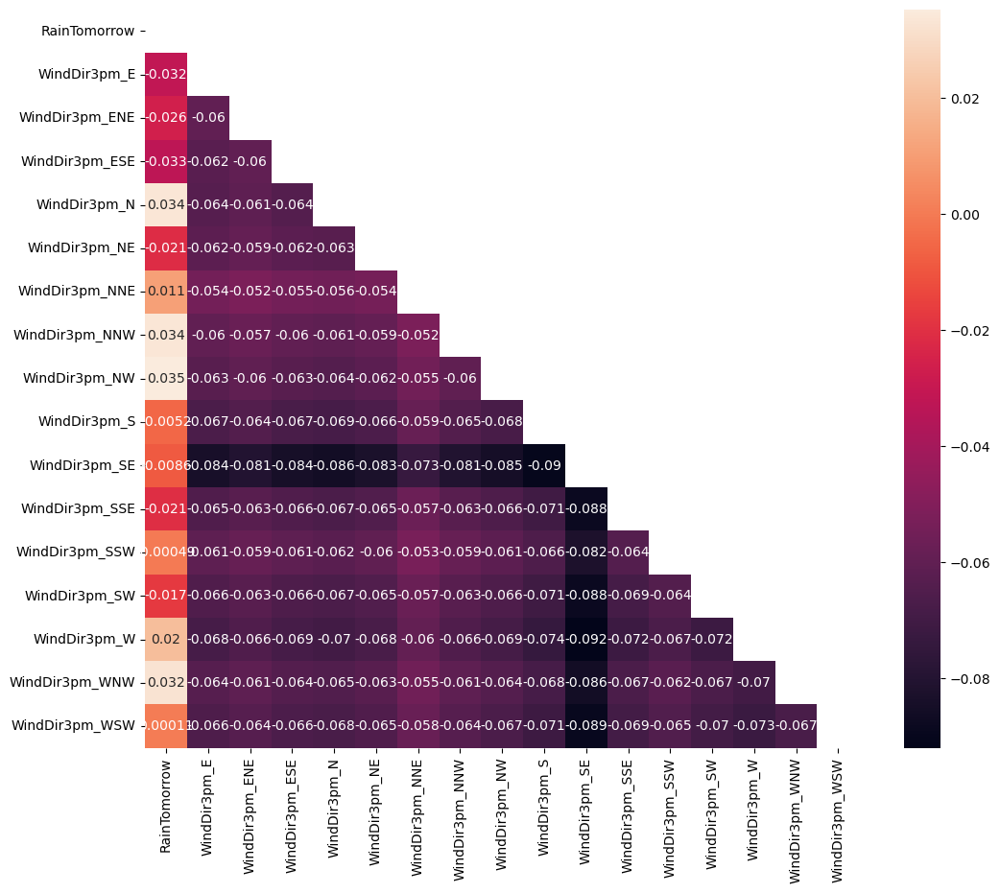

In [62]:
cols = ['RainTomorrow','WindDir3pm_E', 'WindDir3pm_ENE', 'WindDir3pm_ESE', 'WindDir3pm_N',
       'WindDir3pm_NE', 'WindDir3pm_NNE', 'WindDir3pm_NNW', 'WindDir3pm_NW',
       'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE', 'WindDir3pm_SSW',
       'WindDir3pm_SW', 'WindDir3pm_W', 'WindDir3pm_WNW', 'WindDir3pm_WSW']
new_data = df[cols]
plt.figure(figsize=(12,10))
sns.heatmap(new_data.corr(),annot=True,mask=np.triu(new_data.corr()))

Untuk korelasi fitur WindDir9am & WinDir3am terhadap RainTomorrow dapat dilihat melalui visualisasi diatas bahwa nilai korelasi terlalu kecil sehingga lebih baik drop fitur ini

In [63]:
drop_cols = ['WindDir9am_E','WindDir9am_ENE', 'WindDir9am_ESE', 'WindDir9am_N', 'WindDir9am_NE','WindDir9am_NNE',
             'WindDir9am_NNW', 'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE', 'WindDir9am_SSE','WindDir9am_SSW',
             'WindDir9am_SW','WindDir9am_W', 'WindDir9am_WNW', 'WindDir9am_WSW','WindDir3pm_E',
             'WindDir3pm_ENE', 'WindDir3pm_ESE', 'WindDir3pm_N','WindDir3pm_NE','WindDir3pm_NNE','WindDir3pm_NNW',
             'WindDir3pm_NW','WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE', 'WindDir3pm_SSW','WindDir3pm_SW',
             'WindDir3pm_W', 'WindDir3pm_WNW', 'WindDir3pm_WSW']
df.drop(drop_cols, axis=1, inplace=True)
df.head()

,Sunshine,WindGustSpeed,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,8.5,44.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,0
1,8.5,44.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,0
2,8.5,46.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,0
3,8.5,24.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,0
4,8.5,41.0,82.0,33.0,1010.8,1006.0,7.0,8.0,29.7,0,0


In [64]:
df.columns

Index(['Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [65]:
df.isnull().sum()

Sunshine         0
WindGustSpeed    0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

MELIHAT NILAI SKEWNESS

Sunshine
-0.1126334241086284
WindGustSpeed
0.45930869661991536
Humidity9am
-0.436600647563127
Humidity3pm
0.033042034981426625
Pressure9am
0.010117848320530552
Pressure3pm
0.03275036396518271
Cloud9am
-0.5511463892685589
Cloud3pm
-0.45728185518220543
Temp3pm
0.2615575744988924


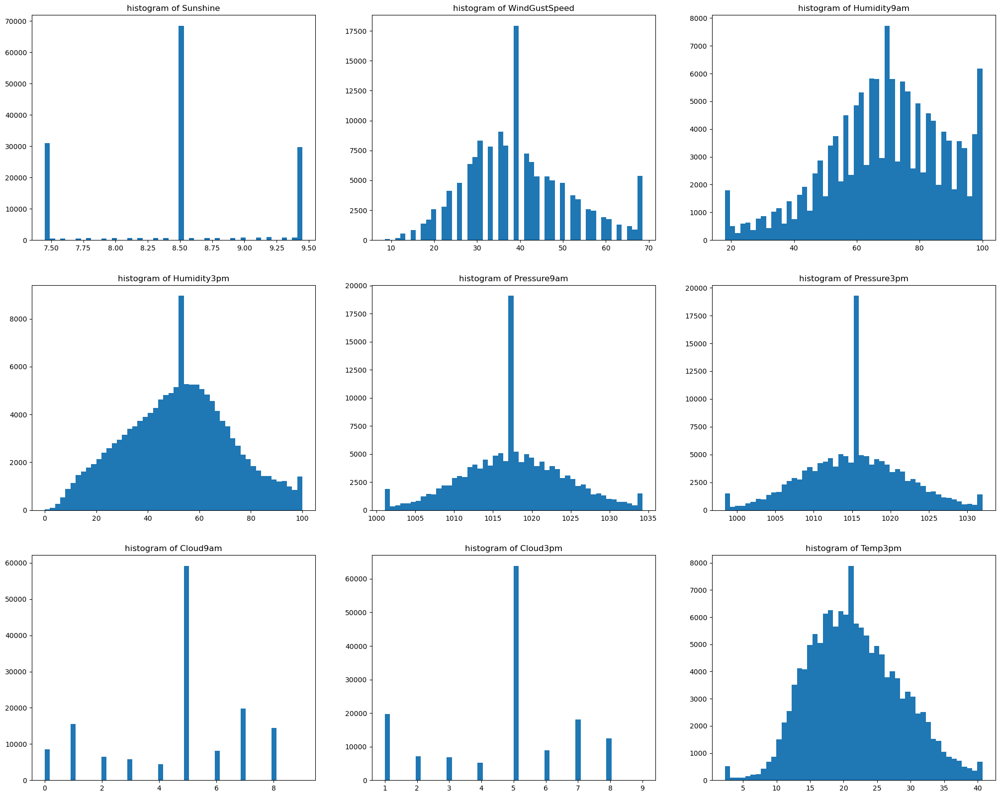

In [66]:
cols = ['Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm','Pressure9am', 'Pressure3pm', 
        'Cloud9am', 'Cloud3pm', 'Temp3pm']
fig, ax = plt.subplots(3,3, sharex=False, sharey=False, figsize=(25,20))
counts = 0
for col in cols:
    ax_x = counts//3
    ax_y = counts%3
    plt.title(f"skew of {col} : {skew(df[col])}")
    print(col)
    print(skew(df[col]))
    ax[ax_x, ax_y].hist(df[col],bins=50)
    ax[ax_x, ax_y].set_title(f"histogram of {col}")    
    counts+=1
plt.show()


aturan praktis skewness :

cukup simetris (fairly symmetrical) : -0.5 to 0.5

kemiringan sedang (moderate skewed) : -0.5 to -1.0 and 0.5 to 1.0

kemiringan berat (highly skewed) : <-1.0 and > 1.0

Untuk skewness pada column diatas masih dalam range fairly symmterical jadi tidak perlu melakukan transformasi untuk normalisasi data.

SPLITTING DATA

In [67]:
y = df['RainTomorrow'].astype('int64') # variabel dependent atau target
X = df.drop(['RainTomorrow'], axis=1) # variabel independen atau fitur input

Splitting Data Training and Data Testing

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Scaling Data menggunakan MinMaxScaler

In [69]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

MODELLING

In [70]:
# Logistik Regression
model_lr = LogisticRegression(solver='saga')
model_lr.fit(X_train, y_train)
ypred = model_lr.predict(X_test)
print("Accuracy: ",metrics.accuracy_score(y_test, ypred))
print(metrics.confusion_matrix(y_test, ypred))
print(metrics.classification_report(y_test, ypred))

Accuracy:  0.8394908340756716
[[31158  1975]
 [ 4872  4653]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     33133
           1       0.70      0.49      0.58      9525

    accuracy                           0.84     42658
   macro avg       0.78      0.71      0.74     42658
weighted avg       0.83      0.84      0.83     42658



dapat dilihat bahwa model memiliki akurasi yang tinggi tetapi imbalance

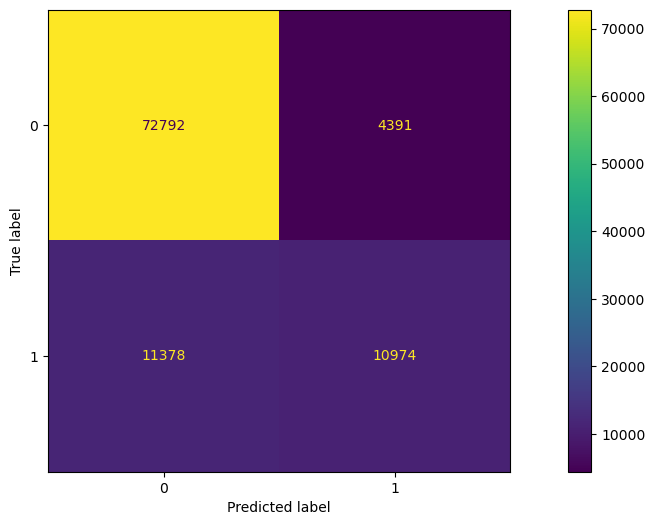

In [71]:
ConfusionMatrixDisplay.from_estimator(model_lr, X_train, y_train)

In [72]:
# check overfitting or under fitting
print("Train Data Score: {}".format(model_lr.score(X_train, y_train)))
print("Test Data Score: {}".format(model_lr.score(X_test, y_test)))

Train Data Score: 0.8415733159190235
Test Data Score: 0.8394908340756716


tidak overfitting maupun underfitting pada model data hampir memiliki akurasi yang hampir sama

In [73]:
# SUPPORT VECTOR MACHINES (SVM)
svm_model = svm.SVC()
svm_model.fit(X_train, y_train)
ypred2=svm_model.predict(X_test)
print("Acc: ", metrics.accuracy_score(y_test, ypred2))
print(metrics.confusion_matrix(y_test, ypred2))
print(metrics.classification_report(y_test, ypred2))

Acc:  0.8437807679684936
[[31768  1365]
 [ 5299  4226]]
              precision    recall  f1-score   support

           0       0.86      0.96      0.91     33133
           1       0.76      0.44      0.56      9525

    accuracy                           0.84     42658
   macro avg       0.81      0.70      0.73     42658
weighted avg       0.83      0.84      0.83     42658



dapat dilihat bahwa model memiliki akurasi yang tinggi tetapi imbalance

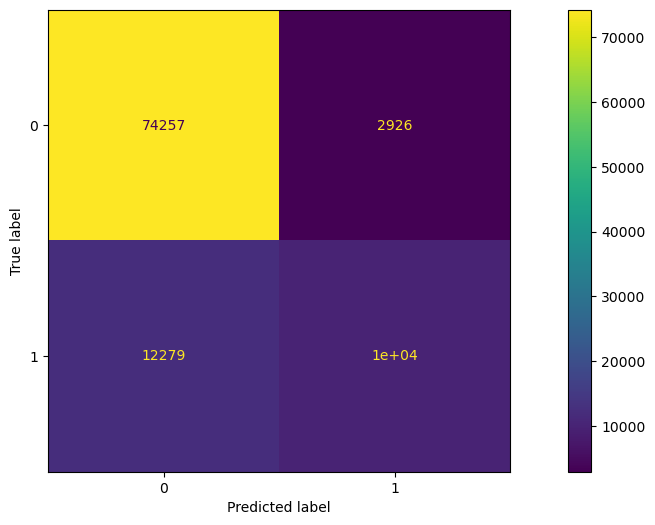

In [74]:
ConfusionMatrixDisplay.from_estimator(svm_model, X_train, y_train)

In [75]:
print("Train Data Score: {}".format(svm_model.score(X_train, y_train)))
print("Test Data Score: {}".format(svm_model.score(X_test, y_test)))

Train Data Score: 0.8472396644396444
Test Data Score: 0.8437807679684936


model tidak overfitting maupun underfitting akurasi hampir sama

Percobaan correcting imbalanced data

In [76]:
# Melakukan oversampling dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Menggunakan MinMaxScaler setelah SMOTE
scaler = MinMaxScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)

In [77]:
# Logistik Regression
modellr = LogisticRegression()
modellr.fit(X_train_resampled_scaled, y_train_resampled)
ypred_lr = modellr.predict(X_test)
print("Acc: ", metrics.accuracy_score(y_test, ypred_lr))
print(metrics.confusion_matrix(y_test, ypred_lr))
print(metrics.classification_report(y_test, ypred_lr))

Acc:  0.7837920202541141
[[26155  6978]
 [ 2245  7280]]
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     33133
           1       0.51      0.76      0.61      9525

    accuracy                           0.78     42658
   macro avg       0.72      0.78      0.73     42658
weighted avg       0.83      0.78      0.80     42658



model sudah lebih balance

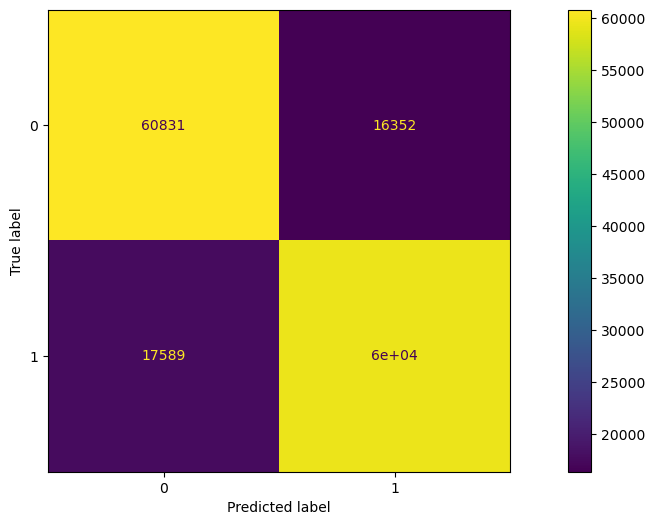

In [78]:
ConfusionMatrixDisplay.from_estimator(modellr, X_train_resampled_scaled, y_train_resampled)

In [79]:
print("Train Data Score: {}".format(modellr.score(X_train_resampled_scaled, y_train_resampled)))
print("Test Data Score: {}".format(modellr.score(X_test, y_test)))

Train Data Score: 0.7801264527162717
Test Data Score: 0.7837920202541141


tidak ada overfitting maupun underfitting akurasi hampir sama

In [80]:
model_svm = svm.SVC(kernel='linear')
model_svm.fit(X_train_resampled_scaled, y_train_resampled)
ypred_svm=model_svm.predict(X_test)
print("Acc: ", metrics.accuracy_score(y_test, ypred_svm))
print(metrics.confusion_matrix(y_test, ypred_svm))
print(metrics.classification_report(y_test, ypred_svm))

Acc:  0.7839326738243706
[[26164  6969]
 [ 2248  7277]]
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     33133
           1       0.51      0.76      0.61      9525

    accuracy                           0.78     42658
   macro avg       0.72      0.78      0.73     42658
weighted avg       0.83      0.78      0.80     42658



model sudah lebih balance

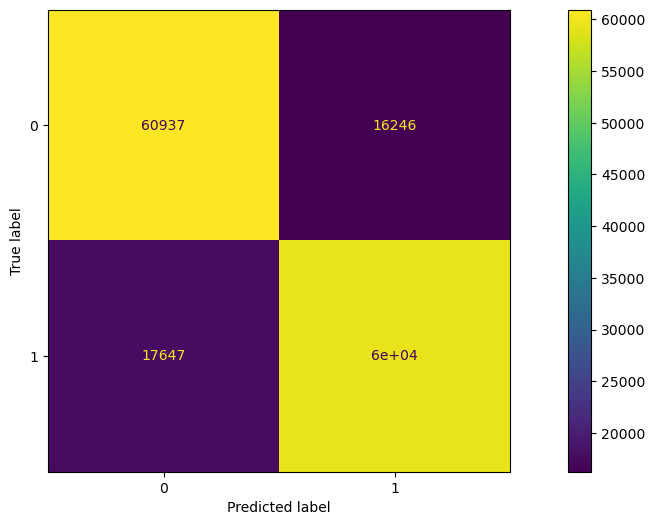

In [81]:
ConfusionMatrixDisplay.from_estimator(model_svm, X_train_resampled_scaled, y_train_resampled)

In [82]:
print("Train Data Score: {}".format(model_svm.score(X_train_resampled_scaled, y_train_resampled)))
print("Test Data Score: {}".format(model_svm.score(X_test, y_test)))

Train Data Score: 0.7804374020185793
Test Data Score: 0.7839326738243706


tidak ada overfitting maupun underfitting akurasi hampir sama

Conclusion

Dataset ini memiliki dimensi yang cukup tinggi yaitu 145460 rows × 23 columns, dengan column tipe categorical berjumlah 7 column dan column tipe numerical berjumlah 16. Terdapat banyak missing value pada dataset ini, maka dari itu diperlukan proses pengisian data menggunakan metode mean/median untuk column tipe numeric dan metode mode untuk pengisian data yang bertipe categorical.Jumlah data pada variabel target (RainTomorrow) terdapat perbedaan jumlah yang cukup besar. Dimana jumlah data 'No' sebesar 110316 dengan persentase 77.58% sedangkan jumlah data 'Yes' hanya sebesar 31877 dengan persentase dari keseluruhan data sebesar 22.42%. korelasi antar fitur Sunshine(intensitas cahaya matahari) berbanding terbalik dengan Rainfall(jumlah curah hujan), semakin rendah nilai sunshine semakin tinggi nilai Rainfall dan sebaliknya. sedangkan korelasi antara Sunshine berbanding lurus dengan Evaporation (penguapan), semakin tinggi nilai Sunshine semakin tinggi pula nilai Evaporation. Kota Portland,Walpole,Caims,Norfolk Island,Dartmoor merupakan top 5 kota dengan curah hujan harian terbanyak sedangkan Kota Uluru, Alice Springs, dan Woomera merupakan 3 terendah dengan jumlah kurang dari 10%. fitur humidity3pm memiliki korelasi yang baik dengan RainTomorrow pada visualisasi scatterplot. untuk waktu yang mengalami tingkat level hujan terbesar terjadi pada bulan Juni dan Juli. setelah melakukan seleksi fitur menggunakan visualisasi heatmap seaborn didapatkan fitur akhir yaitu 'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm','Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm', 'RainToday' dikarenakan memiliki pengaruh yang cukup tinggi terhadap RainTomorrow. Setelah dilakukan Trainin data dengan Logistic Regression dan SVM didapatkan untuk algoritma Logistic Regression menghasilkan score akurasi sebesar 0.83 dan untuk algoritma svm menghasilkan score akurasi sebesar 0.84. Akurasi dari kedua algoritma tidak mengalami overfitting maupun underfitting, dan akurasi dari kedua algoritma tidak jauh berbeda tetapi untuk runtime executed algoritma svm memakan waktu yang cukup lama dibandingkan dengan algoritma logistic regression. Dikarenakan variabel target (RainTomorrow) memiliki perbedaan jumlah data yang cukup besar sehingga mengalami imbalance data, kami melakukan percobaan untuk handling imbalanced data menggunakan metode oversampling SMOTE. Tetapi akurasi yang dihasilkan mengalami penurunan drastis yaitu sekitar 0.7837 untuk Logistik Regression & 0.7839 untuk SVM.